In [ ]:
!pip install lpips torchmetrics
import os


if not os.path.exists('/root/.kaggle/kaggle.json'):
    from google.colab import files
    files.upload()
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d philiphofmann/o-haze
!unzip -q o-haze.zip -d ohaze_data

Dataset URL: https://www.kaggle.com/datasets/philiphofmann/o-haze
License(s): unknown
o-haze.zip: Skipping, found more recently modified local copy (use --force to force download)
replace ohaze_data/O-HAZY/GT/01_outdoor.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [12]:
import torch
import torch.nn as nn

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(channels, channels, 3, padding=1, bias=False),
            nn.InstanceNorm2d(channels, affine=True),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels, channels, 3, padding=1, bias=False),
            nn.InstanceNorm2d(channels, affine=True)
        )
    def forward(self, x):
        return x + self.conv(x)

class DehazeNet(nn.Module):
    def __init__(self):
        super(DehazeNet, self).__init__()
        # Encoder
        self.down1 = nn.Sequential(nn.Conv2d(3, 64, 3, padding=1), nn.ReLU(inplace=True))
        self.down2 = nn.Sequential(nn.Conv2d(64, 128, 3, stride=2, padding=1), nn.ReLU(inplace=True))
        self.down3 = nn.Sequential(nn.Conv2d(128, 256, 3, stride=2, padding=1), nn.ReLU(inplace=True))

        # Bottleneck with Residual Blocks
        self.bottleneck = nn.Sequential(*[ResidualBlock(256) for _ in range(4)])

        # Decoder
        self.up1 = nn.Sequential(nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1), nn.ReLU(inplace=True))
        self.up2 = nn.Sequential(nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1), nn.ReLU(inplace=True))
        self.out = nn.Sequential(nn.Conv2d(64, 3, 3, padding=1), nn.Sigmoid())

    def forward(self, x):
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        b = self.bottleneck(d3)
        u1 = self.up1(b)
        u2 = self.up2(u1 + d2) # Skip connection
        return self.out(u2 + d1) # Skip connection

In [13]:
import glob
import cv2
import numpy as np
from torch.utils.data import Dataset, DataLoader, random_split

class OHazeDataset(Dataset):
    def __init__(self, root_dir, size=256):
        self.hazy_images = sorted(glob.glob("/content/ohaze_data/**/hazy/*.jpg", recursive=True))
        self.gt_images = sorted(glob.glob("/content/ohaze_data/**/GT/*.jpg", recursive=True))
        self.size = size

    def __len__(self):
        return len(self.hazy_images)

    def __getitem__(self, idx):
        haze = cv2.cvtColor(cv2.imread(self.hazy_images[idx]), cv2.COLOR_BGR2RGB)
        gt = cv2.cvtColor(cv2.imread(self.gt_images[idx]), cv2.COLOR_BGR2RGB)

        haze = cv2.resize(haze, (self.size, self.size)) / 255.0
        gt = cv2.resize(gt, (self.size, self.size)) / 255.0

        haze = torch.from_numpy(haze).float().permute(2, 0, 1)
        gt = torch.from_numpy(gt).float().permute(2, 0, 1)
        return haze, gt

dataset = OHazeDataset("ohaze_data")
train_size = int(0.7 * len(dataset))
val_size = int(0.15 * len(dataset))
test_size = len(dataset) - train_size - val_size

train_db, val_db, test_db = random_split(dataset, [train_size, val_size, test_size])

train_loader = DataLoader(train_db, batch_size=4, shuffle=True)
val_loader = DataLoader(val_db, batch_size=1, shuffle=False)
test_loader = DataLoader(test_db, batch_size=1, shuffle=False)

In [ ]:
import torch.nn as nn
from torchmetrics.image import StructuralSimilarityIndexMeasure
device = "cuda" if torch.cuda.is_available() else "cpu"
model = DehazeNet().to(device)


l1_criterion = nn.L1Loss()
ssim_criterion = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

optimizer = optim.AdamW(model.parameters(), lr=2e-4, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=15)
scaler = torch.amp.GradScaler('cuda')
def train_model(epochs=10):
    model.train()
    print(f"Starting training on {device}...")
    for epoch in range(epochs):
        avg_loss = 0
        for haze, gt in train_loader:
            haze, gt = haze.to(device), gt.to(device)
            optimizer.zero_grad()

            
            with torch.cuda.amp.autocast():
                pred = model(haze)
                loss = criterion(pred, gt)

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            avg_loss += loss.item()

        
        print(f"Epoch [{epoch+1}/{epochs}] - Average L1 Loss: {avg_loss/len(train_loader):.6f}")

train_model(epochs=10)

Starting training on cuda...


/tmp/ipython-input-3674924476.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch [1/10] - Average L1 Loss: 0.167072
Epoch [2/10] - Average L1 Loss: 0.129515
Epoch [3/10] - Average L1 Loss: 0.123347
Epoch [4/10] - Average L1 Loss: 0.116086
Epoch [5/10] - Average L1 Loss: 0.117295
Epoch [6/10] - Average L1 Loss: 0.112176
Epoch [7/10] - Average L1 Loss: 0.114375
Epoch [8/10] - Average L1 Loss: 0.108420
Epoch [9/10] - Average L1 Loss: 0.108345
Epoch [10/10] - Average L1 Loss: 0.109750



 PERFORMANCE METRICS: TRAINING SET
MSE:   0.017176
PSNR:  17.7105
SSIM:  0.3048
LPIPS: 0.7309


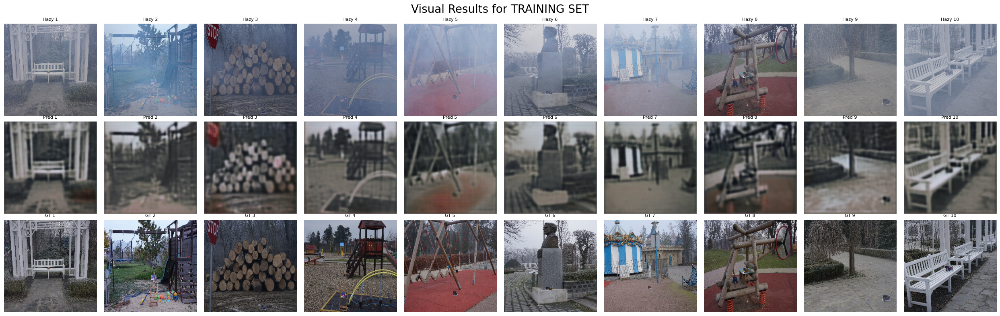


 PERFORMANCE METRICS: VALIDATION SET
MSE:   0.023069
PSNR:  16.7248
SSIM:  0.2772
LPIPS: 0.7501


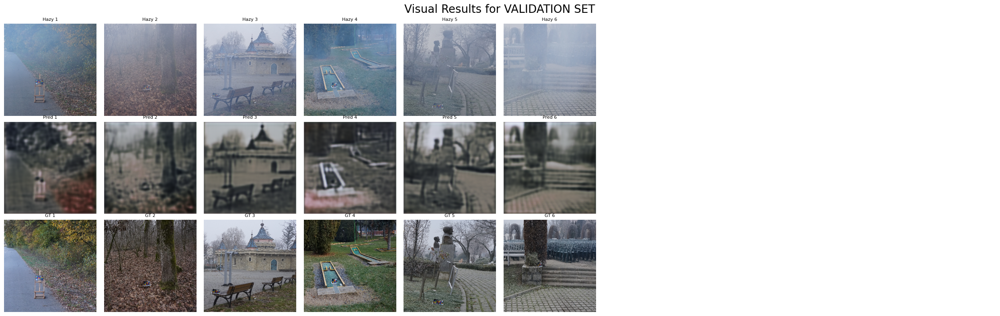


 PERFORMANCE METRICS: TESTING SET
MSE:   0.019635
PSNR:  17.1261
SSIM:  0.2437
LPIPS: 0.7734


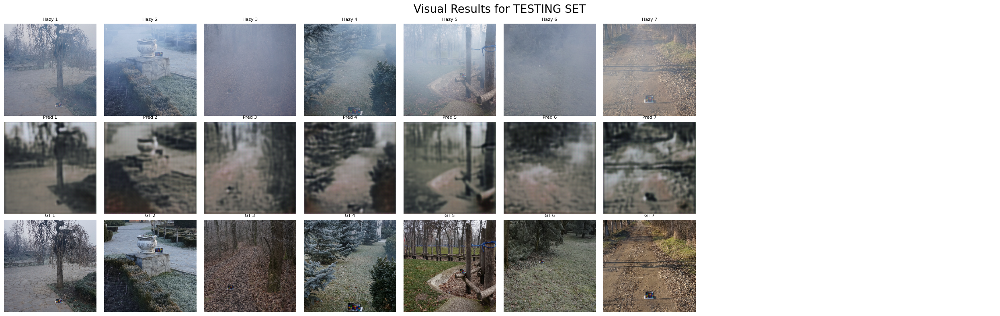

In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np


import torchmetrics.functional as metrics

def evaluate_and_visualize(loader, name="Dataset"):
    model.eval()
    mse_total, psnr_total, ssim_total, lpips_total = 0, 0, 0, 0
    samples = []

    with torch.no_grad():
        for haze, gt in loader:
            haze, gt = haze.to(device), gt.to(device)
            pred = model(haze)
            pred = torch.clamp(pred, 0, 1)

            
            mse_total += torch.mean((pred - gt)**2).item()

            
            psnr_total += metrics.peak_signal_noise_ratio(pred, gt, data_range=1.0).item()
            ssim_total += metrics.structural_similarity_index_measure(pred, gt, data_range=1.0).item()

            # LPIPS calculation (handling the batch mean)
            lpips_val = lpips_fn(pred * 2 - 1, gt * 2 - 1).mean().item()
            lpips_total += lpips_val

            
            if len(samples) < 10:
                for j in range(haze.size(0)):
                    if len(samples) < 10:
                        samples.append((haze[j].cpu(), pred[j].cpu(), gt[j].cpu()))

    num_batches = len(loader)
    print(f"\n{'='*30}")
    print(f" PERFORMANCE METRICS: {name}")
    print(f"{'='*30}")
    print(f"MSE:   {mse_total/num_batches:.6f}")
    print(f"PSNR:  {psnr_total/num_batches:.4f}")
    print(f"SSIM:  {ssim_total/num_batches:.4f}")
    print(f"LPIPS: {lpips_total/num_batches:.4f}")

    # Create the 3x10 Grid
    fig, axes = plt.subplots(3, 10, figsize=(25, 8))
    for i in range(10):
        if i < len(samples):
            # Row 0: Hazy
            axes[0, i].imshow(samples[i][0].permute(1, 2, 0).numpy())
            axes[0, i].set_title(f"Hazy {i+1}", fontsize=8)

            # Row 1: Prediction
            axes[1, i].imshow(samples[i][1].permute(1, 2, 0).numpy())
            axes[1, i].set_title(f"Pred {i+1}", fontsize=8)

            # Row 2: Ground Truth
            axes[2, i].imshow(samples[i][2].permute(1, 2, 0).numpy())
            axes[2, i].set_title(f"GT {i+1}", fontsize=8)

        for row in range(3):
            axes[row, i].axis('off')

    plt.suptitle(f"Visual Results for {name}", fontsize=20)
    plt.tight_layout()
    plt.show()

# Run for all three splits
evaluate_and_visualize(train_loader, "TRAINING SET")
evaluate_and_visualize(val_loader, "VALIDATION SET")
evaluate_and_visualize(test_loader, "TESTING SET")